In [1]:
import pandas as pd
import numpy as np
import os
import random
from PIL import Image
from sklearn.manifold import Isomap
import glob
import librosa
import soundfile as sf
import matplotlib.pyplot as plt
import librosa.display
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from IPython.display import Audio as aud
from sklearn import datasets,decomposition
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
import seaborn as sns
print(os.getcwd())

C:\Users\distefano\data_science_project\audio


In [2]:
root_path = os.path.join(os.getcwd(),'dataset','genre_multi_classification','data')
print('number of genre:',len(list(os.listdir(os.path.join(root_path,'genres_original')))))

number of genre: 10


In [3]:
class genreDataset():
    def __init__(self, audio_dataset_path,sample_duration_in=1):
        self.root_path = audio_dataset_path
        self.audio_raw_path = os.path.join(audio_dataset_path,'genres_original')
        self.genre_audio_list  = glob.glob(os.path.join(self.audio_raw_path,'*','*.wav'))
        #genre_sr_uniq, genre_duration_uniq= self.check_info_dataset(self.genre_audio_list)
        #print('total audio len:',len(self.genre_audio_list))
        #self.real_audio_origin_path_list  = glob.glob(os.path.join(audio_dataset_path,'REAL','*.wav'))
        self.sr = 22050
        self.fr_len =2048
        self.hop_len = 512
        self.features_to_extract=None
        self.sample_duration = 5 if sample_duration_in ==None else sample_duration_in
        self.create_validation_train_data(train_prc=0.75)
        #self.create_validation_train_split_idx(train_prc=0.75)        
        #check sr,duration 

    def create_validation_train_data(self,train_prc=0.75):
        #extract genre
        self.genre_list = list(os.listdir(self.audio_raw_path))
        train_df_list=[]
        val_df_list =[]
        for genre_id,genre_ in enumerate(self.genre_list): 
            print(f'genre: {genre_} id: {genre_id}')
            #extract audio per genre 
            genre_data_path=glob.glob(os.path.join(self.audio_raw_path,genre_,'*.wav'))
            genre_sample =[]
            for genre_audio in genre_data_path:
                audio_sample=None
                try: 
                    audio_sample, audio_sr = sf.read(genre_audio)
                except:
                    print(f'{genre_audio} malformed')
                if audio_sample is not None:
                    genre_sample.append(audio_sample)
            #separate in train and val
            genre_len = len(genre_sample)
            train_len = int(genre_len*train_prc)
            train_fold_df = self.create_fold(sample_list=genre_sample[:train_len], genre_name=genre_,genre_id=genre_id)
            val_fold_df = self.create_fold(sample_list=genre_sample[train_len:], genre_name=genre_,genre_id=genre_id)
            train_df_list.append(train_fold_df)
            val_df_list.append(val_fold_df)
        #store dataset 
        self.train_df = pd.concat(train_df_list,axis=0)
        self.val_df = pd.concat(val_df_list,axis=0)
    def create_fold(self, sample_list,genre_name,genre_id):
        fold_data_clip = self.split_dataset(audio_list=sample_list , sample_duration=self.sample_duration)
        fold_data_tmp = pd.DataFrame(fold_data_clip)
        fold_data_tmp['label_str']=genre_name
        fold_data_tmp['label']=genre_id
        return fold_data_tmp
    def split_dataset(self,audio_list, sample_duration=1):
        sample_list=[]
        for audio_ in audio_list:
            clip_list = self.split_audio(audio_, self.sr, sample_duration)
            sample_list= sample_list + clip_list
        return sample_list
    def split_audio(self,sample, sr,clip_duration):
        clip_list = []
        for index_start in np.arange(0, len(sample)-sr*clip_duration, sr*clip_duration):
            if len(sample)<=index_start + sr*clip_duration:
                #padding 
                clip_tmp = sample[index_start:]
                clip_=librosa.util.fix_length(clip_tmp, size=sr*clip_duration)
                clip_list.append(clip_)
                return clip_list
            else:
                clip_ = sample[index_start:(index_start+sr*clip_duration)]
                clip_list.append(clip_)
        return clip_list

    def check_info_dataset(self,path_file):
        sr_list = []
        duration_list = []
        for audio_ in path_file:
            audio_sample=None
            try:
                audio_sample, audio_sr = sf.read(audio_)
            except:
                print(f'{audio_} malformed')
            if audio_sample is not None:
                audio_duration = {audio_sample.shape[0]/audio_sr}
                sr_list.append(audio_sr)
                duration_list.append(audio_duration)
        print('unique sr:', np.unique(sr_list))
        print('unique duration:', np.unique(duration_list))
        return np.unique(sr_list), np.unique(duration_list)
    def create_feature_dataset(self):
        
        self.feature_dataset_train = self.extract_feature_per_data(self.train_df)
        self.feature_dataset_val = self.extract_feature_per_data(self.val_df)
        self.feature_dataset_all = pd.concat([self.feature_dataset_train, self.feature_dataset_val],axis=0)
        print('feature dataset train shape:',self.feature_dataset_train.shape)
        print('feature dataset val shape:',self.feature_dataset_val.shape)
        print('feature dataset all shape:',self.feature_dataset_all.shape)
        return  self.feature_dataset_all, self.feature_dataset_train,self.feature_dataset_val

    def extract_feature_per_data(self,data):
        self.obs = []
        for index, row in data.iterrows():
            obs_feature= self.extract_feature_per_sample(clip=row[:-2].to_numpy(dtype=np.float64),to_extract=self.features_to_extract)
            obs_feature['label']=row.label
            obs_feature['label_str']=row.label_str
            self.obs.append(obs_feature)
        pd_df = pd.DataFrame(self.obs)
        return pd_df 
    def get_default_feature(self):
        return {
                'zero_cross_rate':None,
                'spec_rolloff':None,
                'spec_centroid':None,
                #'chroma': {'bin':15},
                'rmse': None,
                'bandwidth':None,
                'mfccs': {'n_mfcc':20},
                'flatness':None
                    
                    }
    def extract_feature_per_sample(self,clip,to_extract=None):
        feature_to_calculate = self.get_default_feature()  if to_extract==None else to_extract
        features_row = {}
        for feature_ in feature_to_calculate:
            if feature_ =='zero_cross_rate':
                zero_crossings_rate = librosa.feature.zero_crossing_rate(y=clip, frame_length=self.fr_len, hop_length=self.hop_len, pad=True)[0]
                features_row=self.aggregate_feature(feature_,zero_crossings_rate,features_row)
            elif feature_=='spec_rolloff':
                spec_rolloff = librosa.feature.spectral_rolloff(y=clip, sr=self.sr)[0]
                features_row = self.aggregate_feature(feature_,spec_rolloff,features_row)
            elif feature_=='spec_centroid':
                spec_centroid = librosa.feature.spectral_centroid(y=clip, sr=self.sr)[0]
                features_row = self.aggregate_feature(feature_,spec_centroid,features_row)
            elif feature_=='chroma':
                n_bins = feature_to_calculate[feature_]['bin']
                chroma_vq = librosa.feature.chroma_vqt(y=clip, sr=self.sr,bins_per_octave=n_bins, intervals='equal')
                features_row = self.aggregate_feature(feature_,chroma_vq,features_row)
            elif feature_=='rmse':
                S, phase = librosa.magphase(librosa.stft(y=clip, n_fft=self.fr_len,  hop_length=self.hop_len ))
                rms = librosa.feature.rms(S=S)[0]
                features_row = self.aggregate_feature(feature_,rms,features_row)
            elif feature_=='bandwidth':
                spec_bw = librosa.feature.spectral_bandwidth(y=clip, sr=self.sr,n_fft=self.fr_len,  hop_length=self.hop_len )[0]
                features_row = self.aggregate_feature(feature_,spec_bw,features_row)
            elif feature_=='flatness':
                flatness = librosa.feature.spectral_flatness(y=clip,n_fft=self.fr_len,  hop_length=self.hop_len )[0]
                features_row = self.aggregate_feature(feature_,flatness,features_row)
            elif feature_=='mfccs':
                n_mfcc_in = feature_to_calculate[feature_]['n_mfcc']
                mfccs = librosa.feature.mfcc(y=clip, sr=self.sr, n_mfcc=n_mfcc_in)
                features_row = self.aggregate_feature(feature_,mfccs,features_row)
        return features_row
    def aggregate_feature(self,feature_name, feature_value, features_row):
        #print('feature name:',feature_name)
        if len(feature_value.shape)>1 and feature_value.shape[1]>0:
            #print('fe nae',feature_name,'matrix', feature_value.shape)
            feature_mean = np.mean(feature_value,axis=1)
            feature_max = np.max(feature_value,axis=1)
            feature_std = np.std(feature_value,axis=1)
            for idx in range(feature_value.shape[0]):
                features_row[feature_name+f'__mean{idx}'] = feature_mean[idx]
                features_row[feature_name+f'__max{idx}'] = feature_max[idx]
                features_row[feature_name+f'__std{idx}'] = feature_std[idx]
        else:
            #print('values', feature_value.shape)
            features_row[feature_name+'__mean']=np.mean(feature_value)
            features_row[feature_name+'__max']=np.max(feature_value)
            features_row[feature_name+'__std']=np.std(feature_value)
        return features_row
   
    def compute_mel_spectogram(self,audio, sr_in, n_fft_in, hop_len_in, n_mels_in):
        #(nmel coefficients x nframe)
        S = librosa.feature.melspectrogram(y=audio, sr=sr_in, n_fft=n_fft_in, hop_length=hop_len_in, n_mels=n_mels_in)
        S_DB = librosa.power_to_db(S, ref=np.max)
        return S_DB
    def standardization_spectogram(self,spect_in):
        mean_spect = spect_in.mean()
        std_spect = spect_in.std()
        spec_norm = (spect_in - mean_spect) / (std_spect + 0.0001)
        return spec_norm
    def scaling_spectogram(self,spect_in):
        spec_min, spec_max = spect_in.min(), spect_in.max()
        spec_scaled = 255 * (spect_in - spec_min) / (spec_max - spec_min)
        spec_scaled = spec_scaled.astype(np.uint8)
        return spec_scaled
    def show_spectogram(self,spec_in,yaxis_in='mel'):
        fig, ax = plt.subplots()
        img = librosa.display.specshow(spec_in, ax=ax, y_axis=yaxis_in, x_axis='time')
        fig.colorbar(img, ax=ax)
    def save_spectogram(self,spec_in,yaxis_in='mel',dpi_in=300,path_out='.',name_out='0.png'):
        with plt.ioff():
            plt.figure()
            ax = plt.axes()
            ax.set_axis_off()
            librosa.display.specshow(spec_in, ax=ax, y_axis=yaxis_in, x_axis='time')
            plt.savefig(os.path.join(path_out,name_out),dpi=300)
            plt.close()
    def load_img(self,path):
        return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    def show_img(self,img_in):
        plt.imshow(img_in)
    def save_img(self,img, path):
        img = Image.fromarray(img)
        img.save(path)
    def create_spectogram_dataset(self,data, yaxis_in='mel',is_train=True):
        split_folder = 'train' if is_train==True else 'val'
        print(f'***create spectogram dataset: {split_folder}***')

        for genre_name in  self.genre_list:
            dataset_tmp = data[data.label_str==genre_name]
            for index, row in dataset_tmp.iterrows():
                if index%100==0:
                    print(f'***{index}***')
                mel_spec = self.5 se(audio=row[:-2].to_numpy(dtype=np.float64) , sr_in=self.sr, n_fft_in=self.fr_len, hop_len_in=self.hop_len, n_mels_in=128)
                
                label_folder = genre_name
                img_name = f'{yaxis_in}_{split_folder}_{label_folder}_{index}.png'
                path_out=os.path.join(self.root_path,'modeling','image_dataset',split_folder,label_folder)
                self.save_spectogram(spec_in=mel_spec,yaxis_in=yaxis_in,dpi_in=300,path_out=path_out,name_out=img_name)

In [13]:
gd=genreDataset(audio_dataset_path=root_path,sample_duration_in=5)

genre: blues id: 0
genre: classical id: 1
genre: country id: 2
genre: disco id: 3
genre: hiphop id: 4
genre: jazz id: 5
C:\Users\distefano\data_science_project\audio\dataset\genre_multi_classification\data\genres_original\jazz\jazz.00054.wav malformed
genre: metal id: 6
genre: pop id: 7
genre: reggae id: 8
genre: rock id: 9


In [14]:
f_all, f_train, f_val  = gd.create_feature_dataset()

feature dataset train shape: (4484, 80)
feature dataset val shape: (1500, 80)
feature dataset all shape: (5984, 80)


In [15]:
f_train.to_csv(os.path.join(root_path,'modeling','feature_dataset','train','feature_train_5s.csv'),index=False)
f_val.to_csv(os.path.join(root_path,'modeling','feature_dataset','val','feature_val_5s.csv'),index=False)
f_all.to_csv(os.path.join(root_path,'modeling','feature_dataset','feature_dataset_5s.csv'),index=False)

In [16]:
gd.create_spectogram_dataset(data=gd.train_df, yaxis_in='mel',is_train=True)

***create spectogram dataset: train***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***
***0***
***100***
***200***
***300***
***400***


In [17]:
gd.create_spectogram_dataset(data=gd.val_df, yaxis_in='mel',is_train=False)

***create spectogram dataset: val***
***0***
***100***
***0***
***100***
***0***
***100***
***0***
***100***
***0***
***100***
***0***
***100***
***0***
***100***
***0***
***100***
***0***
***100***
***0***
***100***


In [3]:
#read csv
feature_data = pd.read_csv(os.path.join(root_path,'modeling','feature_dataset','feature_dataset_5s.csv'),header=0)
feature_data_predictors= list(set(feature_data.columns) - set(['label','label_str']))
print('feature_data',feature_data.shape)

feature_data (5984, 80)


In [4]:
genre_label=feature_data.loc[:,['label','label_str']].drop_duplicates()
genre_label

,label,label_str
0,0,blues
450,1,classical
898,2,country
1345,3,disco
1794,4,hiphop
2242,5,jazz
2686,6,metal
3136,7,pop
3586,8,reggae
4036,9,rock


## EDA  - (before clustering)

feature selection before clustering (reducing complexity and avoid curse of dimensionality issue)
1) manual single feature comparison using cdf
2) automatic feature selection by checking spearman correlation 
3) automatic feature reduction using PCA or nonlineare method like isomap 



In [5]:
def estimate_kmean_para(X,max_cluster=8):
    n_clusters_range = range(2,max_cluster)
    for n_clusters in n_clusters_range:
        kmean_cl = KMeans(n_clusters=n_clusters, n_init="auto", random_state=1110)
        kmean_labels = kmean_cl.fit_predict(X)
        #average silhouette_score for all the samples.
        silhouette_avg = silhouette_score(X, kmean_labels)
        print("n_clusters:",n_clusters,"average silhouette :",silhouette_avg)
        #silhouette scores for each sample
        sample_silhouette_val = silhouette_samples(X, kmean_labels)
        all_deviation_sil=[]
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to cluster i
            silhouette_per_cluster = sample_silhouette_val[kmean_labels == i]
            sil_mean_per_cluster = np.mean(silhouette_per_cluster)
            dev_from_global_mean= ((sil_mean_per_cluster - silhouette_avg)**2)
            all_deviation_sil.append(dev_from_global_mean)
        print('***stat on deviation***')
        print('mean',np.sqrt(np.mean(all_deviation_sil)))
        print('max',np.max(np.sqrt(all_deviation_sil)))

#### eda - single feature comparison using CDF (cumulative distribution function)

In [6]:
def show_specific_ecdf(data_in=None, var_in=None,hue=None,dpi_in=200,y_values=[0.25,0.5,0.75,0.9],x_min=-1,x_max=100,fig_size_in=(8,4)):
    fig, ax = plt.subplots(figsize=(fig_size_in))
    plt.rcParams['figure.dpi'] = dpi_in
    g=sns.ecdfplot(data=data_in, x=var_in, hue=hue, ax=ax)
    if y_values is not None:    
        for line in ax.get_lines():
            x, y = line.get_data()
            for y_to_plot in y_values:
                ind = np.argwhere(y >= y_to_plot)[0, 0]  
                ax.text(x[ind], y_to_plot, f' {x[ind]:.0f}', ha='left', va='top',color=line.get_color())
                ax.axhline(y_to_plot, linestyle='--', color='#cfcfcf', lw=2, alpha=0.75)
    g.set(title=f" {var_in} distribution")
    plt.xlim(x_min, x_max)
    plt.show()

In [16]:
feature_to_evaluate = list(set(feature_data_predictors))#-set(feature_to_exclude))
print('feature to evaluate:',len(feature_to_evaluate))

feature to evaluate: 78


In [18]:
minmax_corr = MinMaxScaler()
X_scaled = pd.DataFrame(minmax_corr.fit_transform(feature_data.loc[:,feature_to_evaluate]),columns=feature_to_evaluate)*100
X_scaled['label_str']=feature_data.label_str

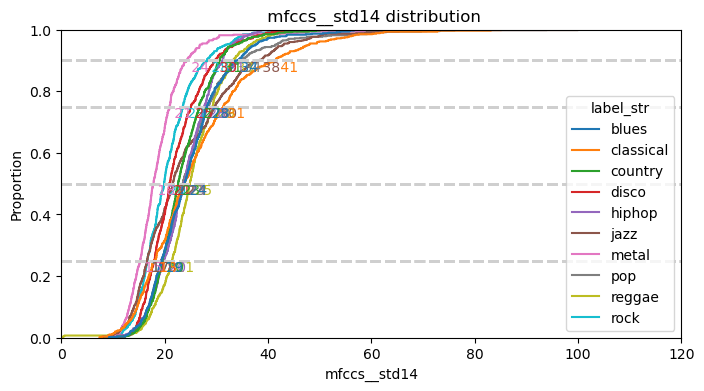

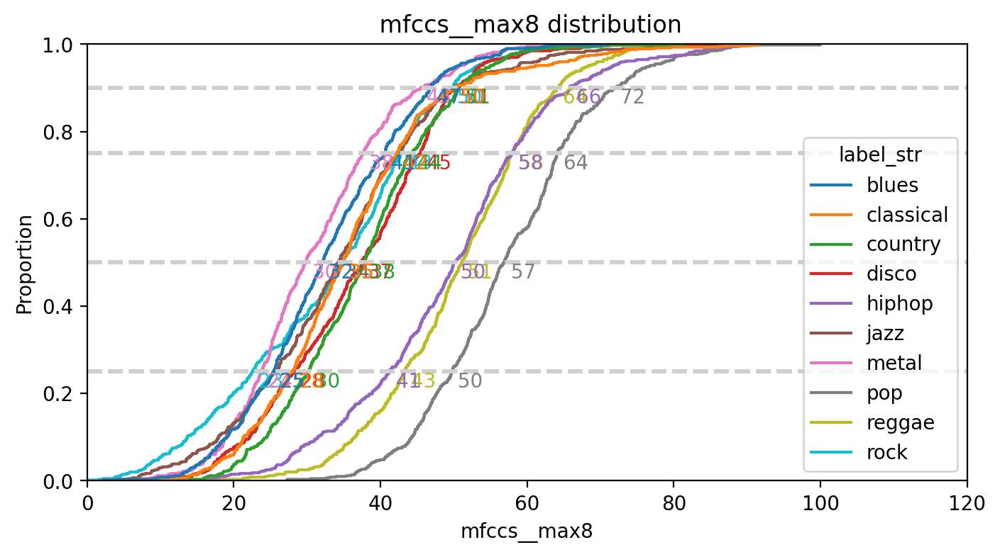

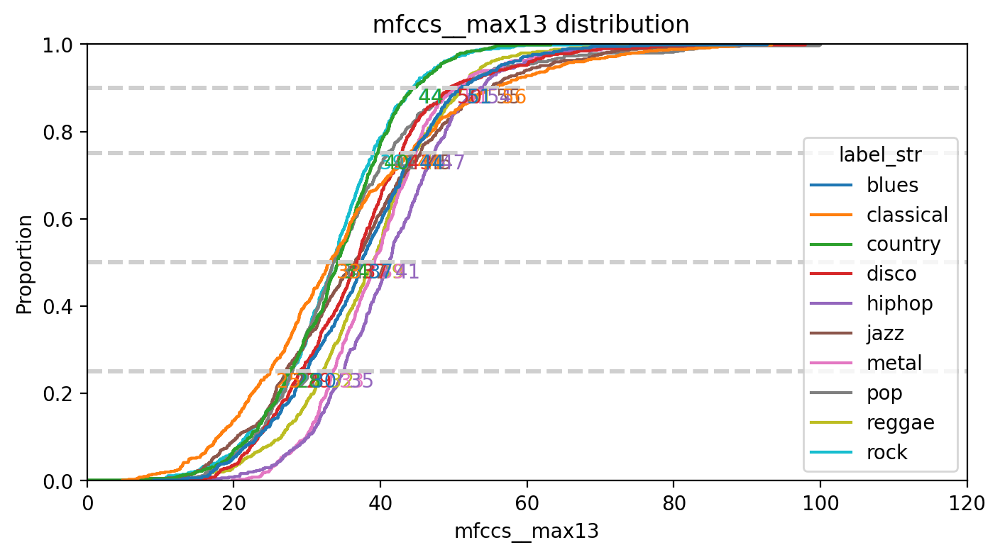

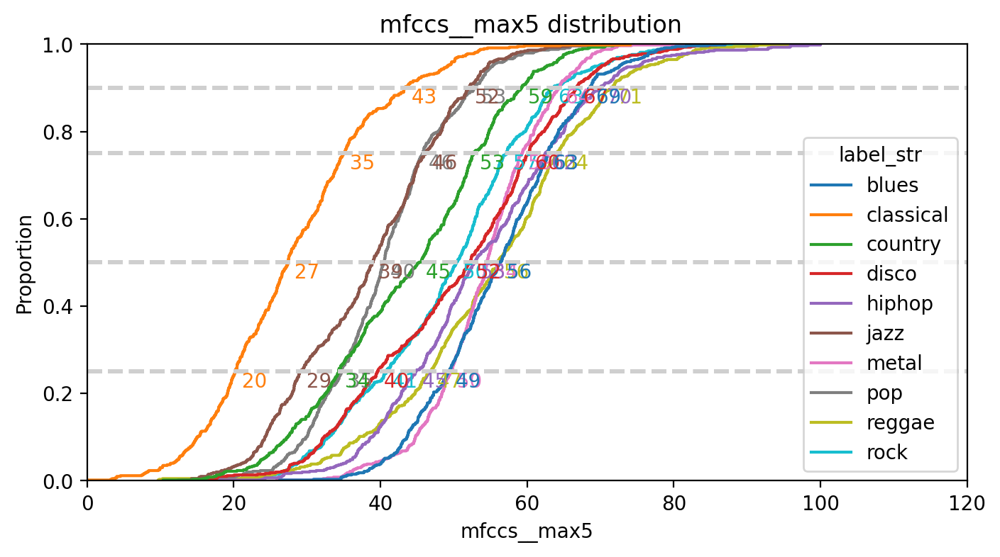

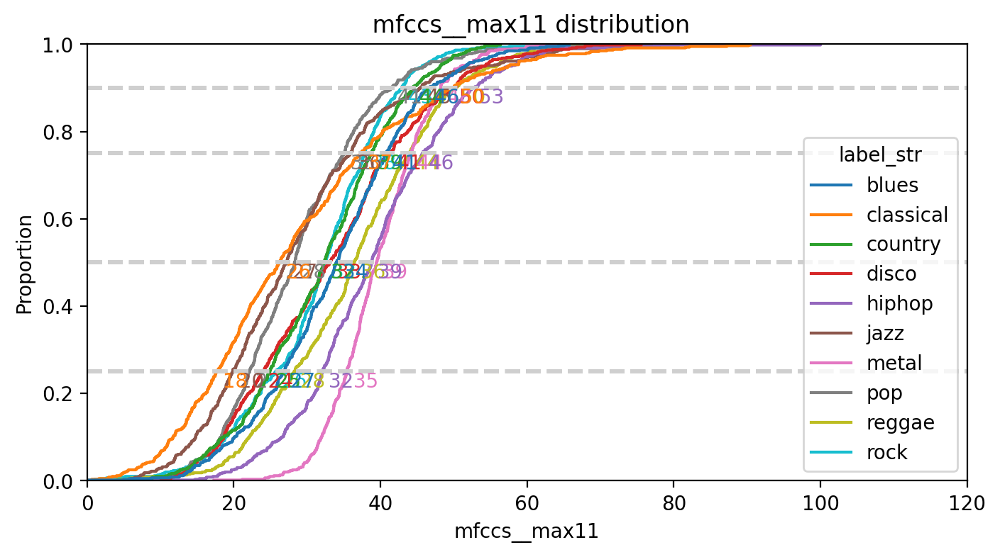

...

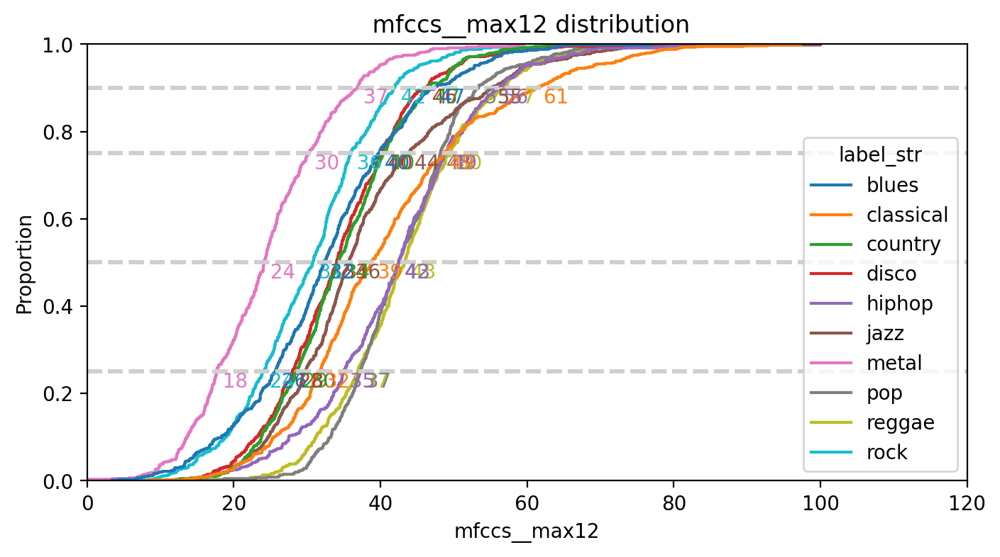

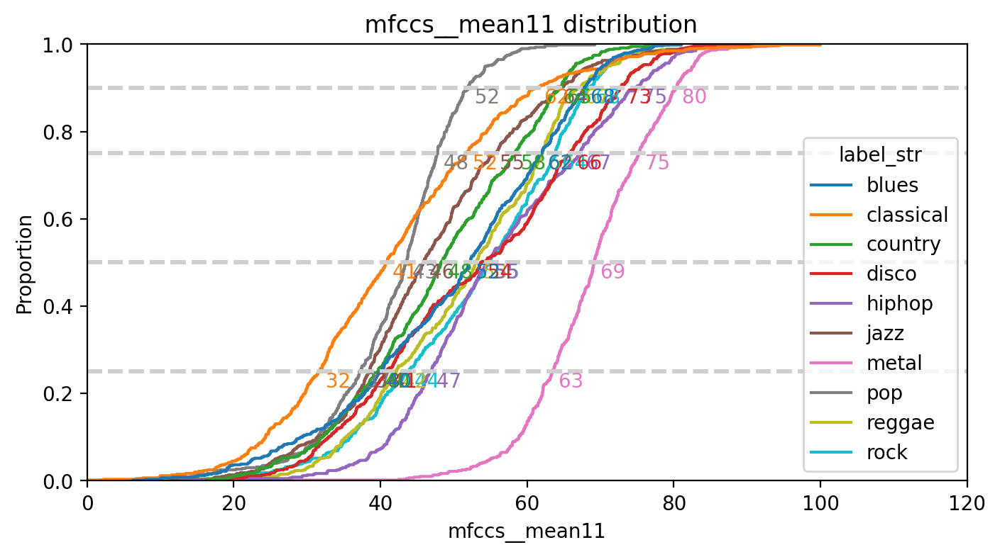

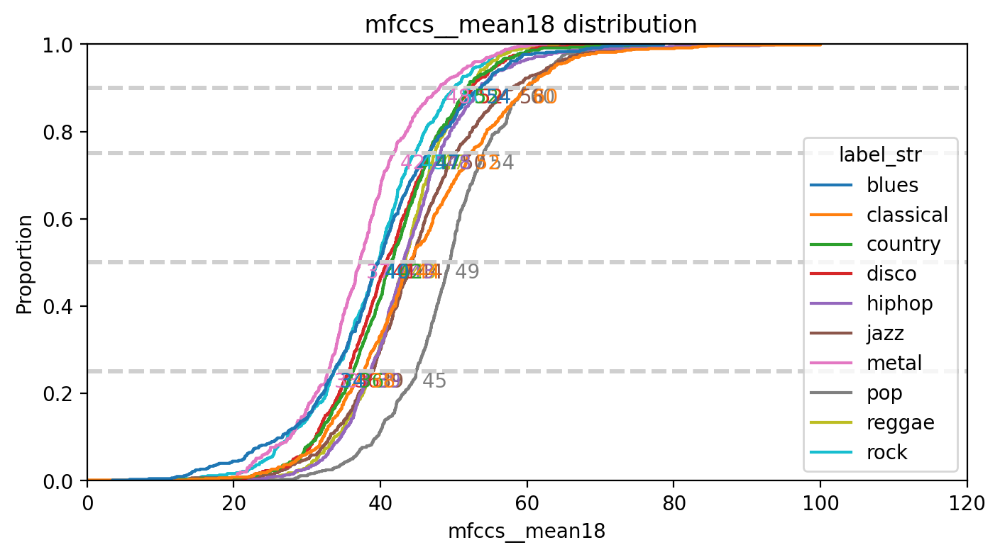

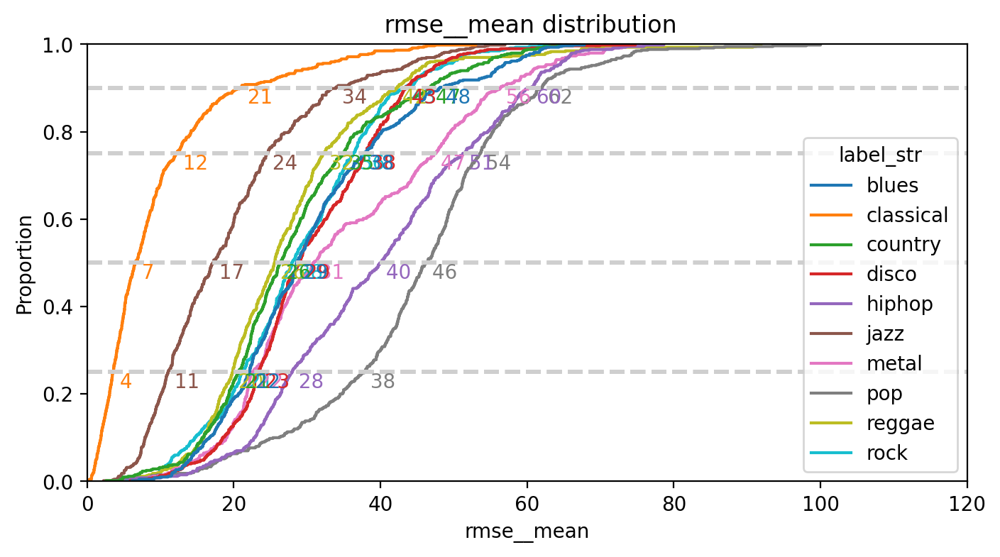

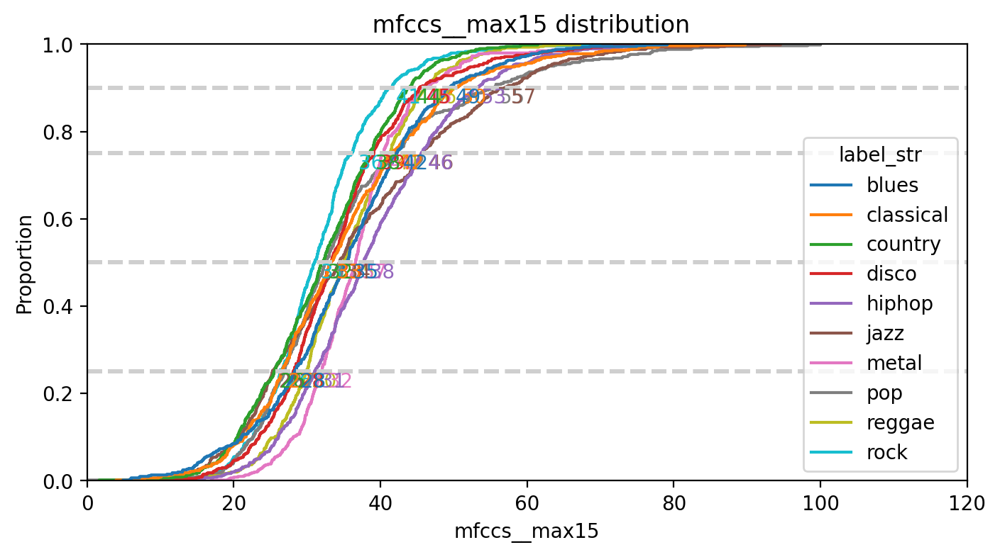

In [19]:
for col in feature_to_evaluate:
    show_specific_ecdf(data_in=X_scaled, var_in=col,hue='label_str',x_min=np.min(X_scaled[col]),x_max=np.max(X_scaled[col])*1.2)

In [7]:
cdf_feature=[
#hiphop,reggae,pop
'mfccs__max8',
#classical, jazz,blues,hiphopcountry
'mfccs__max5',
#metal,classicalreggae,
'mfccs__std10',
'mfccs__mean14',
#classical,blues,metal,hiphop
'mfccs__max3',
'spec_centroid__max',
'mfccs__mean6',
'bandwidth__mean',
#metal,rock,blue
'mfccs__mean12',
#blues,metal,reggae,hiphop,pop
'mfccs__mean8',
#blues,classical,
'flatness__std',
'bandwidth__std',
#pop,classical,metal
'mfccs__mean7',
#jazz,classical
'mfccs__std6',
'spec_centroid__std',
#classical,metal,reggae,hiphop
'mfccs__std1',
#pop,classical,metal,disco
'mfccs__mean9',
#classical,jazz,disco,metal,pop
'mfccs__mean0',
'rmse__max',
'spec_rolloff__max',
'zero_cross_rate__mean',
#country
'mfccs__mean4',
'mfccs__mean1',
'spec_rolloff__mean',
#disco,pop
'flatness__mean',
#country
'mfccs__mean19',
'mfccs__mean5',
'mfccs__max19',
'mfccs__mean3',
'zero_cross_rate__max',
'mfccs__std4',
] #+ feature_to_exclude
print('cdf selected:',len(cdf_feature))

cdf selected: 31


In [82]:
minmax_corr = MinMaxScaler()
X_scaled = pd.DataFrame(minmax_corr.fit_transform(feature_data.loc[:,cdf_feature]))

In [49]:
#estimate kmeans clusters
estimate_kmean_para(X=X_scaled,max_cluster=12)       

n_clusters: 2 average silhouette : 0.2618267685681503
***stat on deviation***
mean 0.021942270931625037
max 0.027635400686857492
n_clusters: 3 average silhouette : 0.25454073647941367
***stat on deviation***
mean 0.037240585816458886
max 0.0570458844021168
n_clusters: 4 average silhouette : 0.21499987408910604
***stat on deviation***
mean 0.08045816048375944
max 0.14087079754805099
n_clusters: 5 average silhouette : 0.19268479868169625
***stat on deviation***
mean 0.08826430288911763
max 0.13412501365784088
n_clusters: 6 average silhouette : 0.17300981498731802
***stat on deviation***
mean 0.07075431661514435
max 0.10541312052070714
n_clusters: 7 average silhouette : 0.15407611281316946
***stat on deviation***
mean 0.08135673999230221
max 0.12422525102863478
n_clusters: 8 average silhouette : 0.12057906442980748
***stat on deviation***
mean 0.05107043193483058
max 0.07751239098423346
n_clusters: 9 average silhouette : 0.11140833951256449
***stat on deviation***
mean 0.0517508408829716


In [83]:
kmean_cl = KMeans(n_clusters=10, n_init="auto", random_state=1110)
kmean_labels = kmean_cl.fit_predict(X_scaled)
X_scaled['cluster'] = kmean_labels
X_scaled['real_y'] = feature_data.label
#X_scaled['real_y'] = (feature_data.label==X_scaled.cluster).astype(int)

In [84]:
#calculate majority label per cluster 
freq_per_cluster=X_scaled.groupby(['cluster','real_y'],as_index=False).agg(major_y = ('real_y','count'))

In [85]:
max_freq_label = freq_per_cluster.groupby(['cluster'])['major_y'].idxmax()

In [86]:
majority_label=freq_per_cluster.iloc[max_freq_label,:]

In [87]:
majority_label

,cluster,real_y,major_y
1,0,1,388
7,1,0,172
21,2,7,193
26,3,3,182
39,4,8,138
45,5,7,299
48,6,0,142
63,7,6,425
74,8,8,218
80,9,5,196


In [88]:
cluster_sum=X_scaled.groupby(['cluster'],as_index=False).agg(tot=('cluster','count'))

In [89]:
res=cluster_sum.merge(majority_label,left_on='cluster',right_on='cluster')
res['%_majority']=res.major_y/res.tot

In [90]:
res.merge(genre_label,left_on='real_y',right_on='label')

,cluster,tot,real_y,major_y,%_majority,label,label_str
0,0,476,1,388,0.815126,1,classical
1,1,559,0,172,0.307692,0,blues
2,6,440,0,142,0.322727,0,blues
3,2,653,7,193,0.295559,7,pop
4,5,618,7,299,0.483819,7,pop
5,3,628,3,182,0.289809,3,disco
6,4,785,8,138,0.175796,8,reggae
7,8,432,8,218,0.504630,8,reggae
8,7,928,6,425,0.457974,6,metal
9,9,465,5,196,0.421505,5,jazz


In [91]:
res.merge(genre_label,left_on='real_y',right_on='label')['%_majority'].mean()

0.4074637599164811

#### eda - spearman correlation

In [76]:
spearm_corr=feature_data.loc[:,feature_data_predictors].corr('spearman')
spearm_corr['mean_corr']= spearm_corr.mean(axis=1)

In [77]:
spearam_feature_scored=spearm_corr.sort_values(by=['mean_corr'],ascending=False).index
less_corr=spearam_feature_scored[:30]
print('less correlated features:\n',less_corr)

less correlated features:
 Index(['spec_centroid__std', 'mfccs__std5', 'spec_centroid__max',
       'zero_cross_rate__std', 'mfccs__std3', 'bandwidth__max',
       'spec_rolloff__std', 'spec_rolloff__max', 'mfccs__std6', 'mfccs__std7',
       'mfccs__max6', 'rmse__std', 'mfccs__max2', 'mfccs__max8', 'mfccs__std4',
       'mfccs__std2', 'mfccs__std9', 'flatness__std', 'mfccs__max4',
       'mfccs__std8', 'flatness__max', 'zero_cross_rate__max',
       'bandwidth__std', 'mfccs__std1', 'mfccs__max10', 'mfccs__std10',
       'rmse__max', 'bandwidth__mean', 'mfccs__max12', 'mfccs__max0'],
      dtype='object')


In [78]:
minmax_corr = MinMaxScaler()
X_scaled = pd.DataFrame(minmax_corr.fit_transform(feature_data.loc[:,less_corr]))
#estimate kmeans clusters
estimate_kmean_para(X=X_scaled,max_cluster=12) 

n_clusters: 2 average silhouette : 0.28581398841490735
***stat on deviation***
mean 0.05047860196261215
max 0.05965851128740873
n_clusters: 3 average silhouette : 0.18115548810203422
***stat on deviation***
mean 0.022845844280263233
max 0.03242745291666993
n_clusters: 4 average silhouette : 0.17389588273373793
***stat on deviation***
mean 0.06124938711441682
max 0.08707058021995118
n_clusters: 5 average silhouette : 0.18045986957641835
***stat on deviation***
mean 0.055982390363634296
max 0.09242463850281779
n_clusters: 6 average silhouette : 0.1402759766597397
***stat on deviation***
mean 0.05234095733285404
max 0.0807122814609037
n_clusters: 7 average silhouette : 0.14337875800985314
***stat on deviation***
mean 0.0571698617611127
max 0.07314756826879704
n_clusters: 8 average silhouette : 0.13565688164040543
***stat on deviation***
mean 0.05217897125961767
max 0.08067660425200968
n_clusters: 9 average silhouette : 0.13221397038787472
***stat on deviation***
mean 0.05419245488030056
m

In [79]:
kmean_cl = KMeans(n_clusters=10, n_init="auto", random_state=1110)
kmean_labels = kmean_cl.fit_predict(X_scaled)
X_scaled['cluster'] = kmean_labels
X_scaled['real_y'] = feature_data.label
#calculate majority label per cluster 
freq_per_cluster=X_scaled.groupby(['cluster','real_y'],as_index=False).agg(major_y = ('real_y','count'))
max_freq_label = freq_per_cluster.groupby(['cluster'])['major_y'].idxmax()
majority_label=freq_per_cluster.iloc[max_freq_label,:]
cluster_sum=X_scaled.groupby(['cluster'],as_index=False).agg(tot=('cluster','count'))
res=cluster_sum.merge(majority_label,left_on='cluster',right_on='cluster')
res['%_majority']=res.major_y/res.tot
res.merge(genre_label,left_on='real_y',right_on='label')

,cluster,tot,real_y,major_y,%_majority,label,label_str
0,0,204,1,158,0.774510,1,classical
1,6,508,1,373,0.734252,1,classical
2,1,622,8,230,0.369775,8,reggae
3,4,393,8,140,0.356234,8,reggae
4,2,1038,6,379,0.365125,6,metal
5,3,536,7,215,0.401119,7,pop
6,9,517,7,249,0.481625,7,pop
7,5,641,5,140,0.218409,5,jazz
8,7,964,3,200,0.207469,3,disco
9,8,561,0,189,0.336898,0,blues


In [81]:
res.merge(genre_label,left_on='real_y',right_on='label')['%_majority'].mean()

0.42454162025245556

#### eda - pca

explained variance: [0.30557472 0.15249065 0.10594423 0.06637364 0.04364031 0.03729668
 0.02666572 0.02105744 0.01754626 0.01569561 0.01433504 0.01217098
 0.01015582 0.00997064 0.00930253]


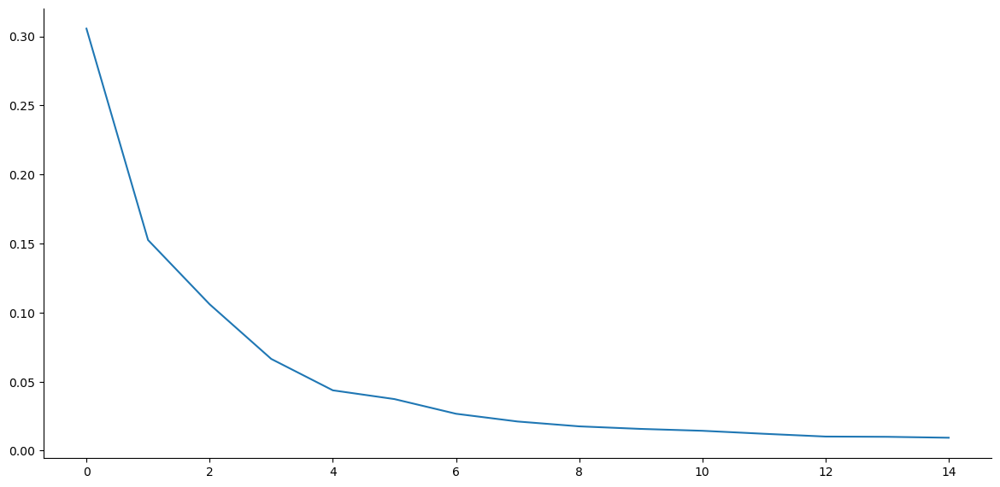

In [106]:
pca_dec = decomposition.PCA(n_components=15,random_state=1211)
#explained variance
 
minmax_pca = MinMaxScaler()
X_scaled = pd.DataFrame(minmax_pca.fit_transform(feature_data.loc[:,feature_data_predictors]))
compressed_data= pd.DataFrame(pca_dec.fit_transform(X_scaled))
print('explained variance:',pca_dec.explained_variance_ratio_)
sns.relplot( kind="line", data=pca_dec.explained_variance_ratio_,height=6,aspect=2)
plt.show()

In [109]:
estimate_kmean_para(X=compressed_data,max_cluster=12)       

n_clusters: 2 average silhouette : 0.24478292788566836
***stat on deviation***
mean 0.013193345426791665
max 0.016305004923999333
n_clusters: 3 average silhouette : 0.23844460911670515
***stat on deviation***
mean 0.06243786344336264
max 0.08658159440077523
n_clusters: 4 average silhouette : 0.2154454850532765
***stat on deviation***
mean 0.08112337755743086
max 0.1140531578490449
n_clusters: 5 average silhouette : 0.20632351259709936
***stat on deviation***
mean 0.08825993634270314
max 0.1229180281700753
n_clusters: 6 average silhouette : 0.2041419377121275
***stat on deviation***
mean 0.08160725270132722
max 0.12428912316156118
n_clusters: 7 average silhouette : 0.18851169258006928
***stat on deviation***
mean 0.08269802947005017
max 0.1307385147904751
n_clusters: 8 average silhouette : 0.15768855105041277
***stat on deviation***
mean 0.06949272588775329
max 0.0910301736639461
n_clusters: 9 average silhouette : 0.13651740853395838
***stat on deviation***
mean 0.04944933794438286
max 

In [107]:
kmean_cl = KMeans(n_clusters=10, n_init="auto", random_state=1110)
kmean_labels = kmean_cl.fit_predict(compressed_data)
X_scaled['cluster'] = kmean_labels
X_scaled['real_y'] = feature_data.label
#calculate majority label per cluster 
freq_per_cluster=X_scaled.groupby(['cluster','real_y'],as_index=False).agg(major_y = ('real_y','count'))
max_freq_label = freq_per_cluster.groupby(['cluster'])['major_y'].idxmax()
majority_label=freq_per_cluster.iloc[max_freq_label,:]
cluster_sum=X_scaled.groupby(['cluster'],as_index=False).agg(tot=('cluster','count'))
res=cluster_sum.merge(majority_label,left_on='cluster',right_on='cluster')
res['%_majority']=res.major_y/res.tot
res.merge(genre_label,left_on='real_y',right_on='label')

,cluster,tot,real_y,major_y,%_majority,label,label_str
0,0,416,1,334,0.802885,1,classical
1,5,401,1,213,0.531172,1,classical
2,1,694,8,162,0.233429,8,reggae
3,2,568,8,194,0.341549,8,reggae
4,3,856,6,408,0.476636,6,metal
5,4,692,3,175,0.252890,3,disco
6,6,554,2,140,0.252708,2,country
7,7,248,4,110,0.443548,4,hiphop
8,8,878,0,179,0.203872,0,blues
9,9,677,7,343,0.506647,7,pop


In [110]:
res.merge(genre_label,left_on='real_y',right_on='label')['%_majority'].mean()

0.4045336440843325

#### eda - isomap

In [111]:
from sklearn.manifold import Isomap
isomap_embedding = Isomap(n_components=30)
minmax_corr = MinMaxScaler()
X_scaled = pd.DataFrame(minmax_corr.fit_transform(feature_data.loc[:,feature_data_predictors]))
emb_X = isomap_embedding.fit_transform(X_scaled)
#estimate kmeans clusters
estimate_kmean_para(X=emb_X,max_cluster=12)       

C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\sklearn\manifold\_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 6 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._

n_clusters: 2 average silhouette : 0.29819335751489123
***stat on deviation***
mean 0.00034297854399931437
max 0.0004206867767110878
n_clusters: 3 average silhouette : 0.260650961319729
***stat on deviation***
mean 0.05553838761366804
max 0.08949744644418062
n_clusters: 4 average silhouette : 0.22266532021671992
***stat on deviation***
mean 0.060325621963810264
max 0.08670311978620796
n_clusters: 5 average silhouette : 0.1802915181702439
***stat on deviation***
mean 0.05848355827316851
max 0.08591573956515766
n_clusters: 6 average silhouette : 0.16041351411580956
***stat on deviation***
mean 0.0651203998112789
max 0.10777348135821652
n_clusters: 7 average silhouette : 0.15422879000200207
***stat on deviation***
mean 0.061866748923916796
max 0.11364586288565232
n_clusters: 8 average silhouette : 0.1369949277141621
***stat on deviation***
mean 0.0674514216856571
max 0.11330300876388971
n_clusters: 9 average silhouette : 0.14216106477105958
***stat on deviation***
mean 0.0704594479499502


In [112]:
kmean_cl = KMeans(n_clusters=10, n_init="auto", random_state=1110)
kmean_labels = kmean_cl.fit_predict(emb_X)
X_scaled['cluster'] = kmean_labels
X_scaled['real_y'] = feature_data.label
#calculate majority label per cluster 
freq_per_cluster=X_scaled.groupby(['cluster','real_y'],as_index=False).agg(major_y = ('real_y','count'))
max_freq_label = freq_per_cluster.groupby(['cluster'])['major_y'].idxmax()
majority_label=freq_per_cluster.iloc[max_freq_label,:]
cluster_sum=X_scaled.groupby(['cluster'],as_index=False).agg(tot=('cluster','count'))
res=cluster_sum.merge(majority_label,left_on='cluster',right_on='cluster')
res['%_majority']=res.major_y/res.tot
res.merge(genre_label,left_on='real_y',right_on='label')

,cluster,tot,real_y,major_y,%_majority,label,label_str
0,0,664,1,560,0.843373,1,classical
1,1,863,0,198,0.229432,0,blues
2,2,726,3,189,0.260331,3,disco
3,3,482,8,213,0.441909,8,reggae
4,5,776,8,197,0.253866,8,reggae
5,4,538,7,373,0.693309,7,pop
6,6,426,5,171,0.401408,5,jazz
7,7,556,4,197,0.354317,4,hiphop
8,9,137,4,114,0.832117,4,hiphop
9,8,816,6,421,0.515931,6,metal


In [113]:
res.merge(genre_label,left_on='real_y',right_on='label')['%_majority'].mean()

0.4825992687295299

## EDA  - (clustering analysis)
    pick up a feature selection method for example isomap, apply kmeans, analyze features per cluster and see eventual differences among the classes

In [114]:
isomap_embedding = Isomap(n_components=30)
minmax_corr = MinMaxScaler()
X_scaled = pd.DataFrame(minmax_corr.fit_transform(feature_data.loc[:,feature_data_predictors]),columns=feature_data_predictors)
emb_X = isomap_embedding.fit_transform(X_scaled)

C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\sklearn\manifold\_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 6 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
C:\Users\distefano\Anaconda3\envs\audio\lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._

In [115]:
kmean_cl = KMeans(n_clusters=10, n_init="auto", random_state=1110)
kmean_labels = kmean_cl.fit_predict(emb_X)
X_scaled['cluster'] = kmean_labels
X_scaled['real_y'] = feature_data.label

In [116]:
#original features(order is the same)
original_data = feature_data.loc[:,feature_data_predictors].copy()
original_data['cluster']=kmean_labels

In [117]:
median_stat= X_scaled.loc[:,feature_data_predictors +['cluster']].groupby(['cluster']).quantile(0.5).T

In [118]:
genre_cols=genre_label.sort_values(by=['label']).label_str
median_stat.columns = genre_cols

In [119]:
median_stat['std']= np.std(median_stat,axis=1)

In [120]:
#median_stat.loc[:,genre_cols]=np.abs(median_stat.loc[:,genre_cols] - median_stat.loc[:,'median'].values.reshape(-1,1))**2

<Axes: xlabel='label_str'>

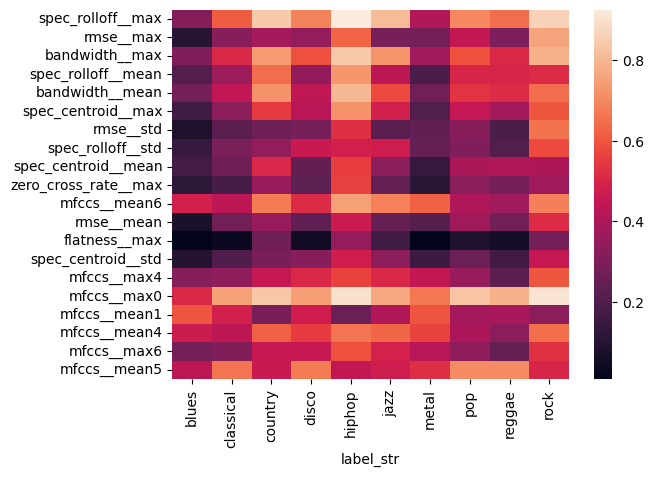

In [121]:
#median_stat['big_diff'] = np.max(median_stat.loc[:,genre_cols],axis=1)
sns.heatmap(median_stat.sort_values(by=['std'],ascending=False).loc[:, genre_cols][:20])

In [125]:
plt.figure(figsize=(12,10))
sns.heatmap(median_stat.sort_values(by=['std'],ascending=False).loc[:, genre_cols][:20])
plt.savefig("heatmap_iso_genre.png",dpi=300)
plt.close()

In [145]:
univariate_feature_var=median_stat.sort_values(by=['std'],ascending=False).loc[:, genre_cols][:30]
univariate_feature_var

label_str,blues,classical,country,disco,hiphop,jazz,metal,pop,reggae,rock
spec_rolloff__max,0.314875,0.610206,0.844734,0.687296,0.925081,0.809446,0.411509,0.699240,0.642780,0.863192
rmse__max,0.105648,0.322199,0.386992,0.345309,0.627638,0.288258,0.281218,0.448337,0.301094,0.757888
bandwidth__max,0.304114,0.508072,0.737948,0.591233,0.840840,0.722973,0.375385,0.592247,0.506504,0.788786
spec_rolloff__mean,0.206882,0.363137,0.645636,0.342265,0.727268,0.437100,0.187808,0.502293,0.501752,0.514222
bandwidth__mean,0.277827,0.444564,0.718504,0.438409,0.800555,0.578411,0.272795,0.534222,0.516203,0.645643
spec_centroid__max,0.163914,0.330384,0.547592,0.425223,0.719643,0.487586,0.204690,0.451972,0.381461,0.602587
rmse__std,0.080200,0.228821,0.264771,0.285687,0.526917,0.228861,0.239371,0.322187,0.188799,0.656272
spec_rolloff__std,0.141331,0.298154,0.347023,0.462262,0.483637,0.471617,0.245132,0.305696,0.205352,0.581259
spec_centroid__mean,0.171280,0.265751,0.504399,0.244794,0.556135,0.333947,0.138424,0.394893,0.412831,0.399341
zero_cross_rate__max,0.117155,0.179319,0.360729,0.232815,0.561267,0.246862,0.109384,0.325164,0.280932,0.371189


## Multi Classifiers
1. Knn
2. Random Forest
3. CNN

In [133]:
from sklearn.model_selection import GridSearchCV,validation_curve,PredefinedSplit
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import average_precision_score,make_scorer,f1_score
f1_custom_score = make_scorer(score_func = f1_score,average='macro' )

In [129]:
X_train = pd.read_csv(os.path.join(root_path,'modeling','feature_dataset','train','feature_train_5s.csv'),header=0)
y_train = X_train.label 
X_train.drop(columns=['label','label_str'],inplace=True)
X_val = pd.read_csv(os.path.join(root_path,'modeling','feature_dataset','val','feature_val_5s.csv'),header=0)
y_val = X_val.label 
X_val.drop(columns=['label','label_str'],inplace=True)

y_all = pd.concat([y_train, y_val],axis=0)
y_all.index = range(len(y_all))
print(y_all.shape)

(5984,)


# KNN

In [140]:
from sklearn.neighbors import KNeighborsClassifier
minmax_scaler = MinMaxScaler()
X_train_scaled= pd.DataFrame(minmax_scaler.fit_transform(X_train),columns=X_train.columns)
X_val_scaled=pd.DataFrame(minmax_scaler.transform(X_val), columns=X_val.columns)
X_all_scaled =  pd.concat([X_train_scaled, X_val_scaled],axis=0)
X_all_scaled.index = range(len(X_all_scaled))
ps = PredefinedSplit([-1]*len(X_train) + [0]*len(X_val))

In [146]:
selected_feature=univariate_feature_var.index
n_neighbors_range=np.arange(5,50,2)
train_score, val_score = validation_curve(KNeighborsClassifier(), X_all_scaled.loc[:,selected_feature], y_all,
                                           param_name="n_neighbors",
                                           param_range=n_neighbors_range,
                                           cv=ps, scoring=f1_custom_score)

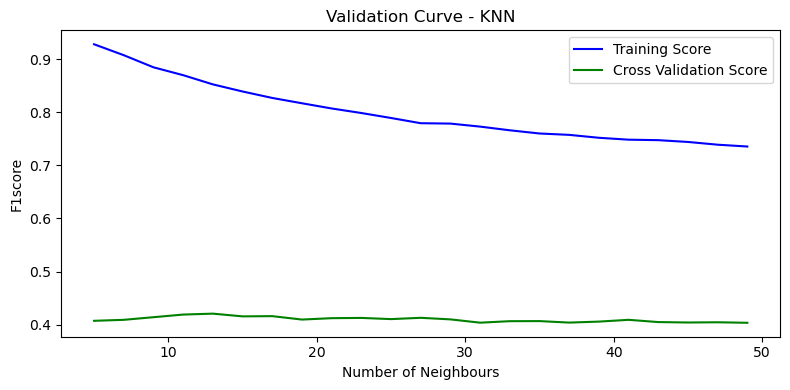

In [147]:
plt.figure(figsize=(8,4))
# Calculating mean of training score
mean_train_score = np.mean(train_score, axis=1)
# Calculating mean of validion score
mean_val_score = np.mean(val_score, axis=1)
# Plot mean accuracy scores for training and validation
plt.plot(n_neighbors_range, mean_train_score,
         label="Training Score", color='b')
plt.plot(n_neighbors_range, mean_val_score,
         label="Cross Validation Score", color='g')
 
# Creating the plot
plt.title("Validation Curve - KNN")
plt.xlabel("Number of Neighbours")
plt.ylabel("F1score")
plt.tight_layout()
plt.legend(loc='best')
plt.show()

In [148]:
kn_model=KNeighborsClassifier(n_neighbors=12)
predicted=kn_model.fit(X=X_train_scaled,y=y_train).predict(X_val_scaled)
print('f1 score average :',f1_score(y_pred=predicted,y_true=y_val,average='macro'))

f1 score average : 0.42212939579554576


In [159]:
print('f1 score average :',f1_score(y_pred=predicted,y_true=y_val,average=None))

f1 score average : [0.23577236 0.94880546 0.36904762 0.39793282 0.14615385 0.46491228
 0.49844237 0.77655678 0.18068536 0.20298507]


## Random Forest 

In [158]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
X_all =  pd.concat([X_train, X_val],axis=0)
X_all.index = range(len(X_all))
ps = PredefinedSplit([-1]*len(X_train) + [0]*len(X_val))

rf = RandomForestClassifier(n_estimators=200, random_state=0)
grid_param = {
    #'class_weight':['balanced','balanced_subsample'],
    'n_estimators':[400],
    'criterion': ['entropy'],
    #'min_samples_leaf':[1],
    #'max_leaf_nodes':[4,24],
     'max_features': ['sqrt'],
    'bootstrap': [False],
    'max_depth':[6,10,12]
}
#cv_model = RepeatedStratifiedKFold(n_splits=3, n_repeats=1, random_state=1)
gd_sr = GridSearchCV(
                    estimator=rf,
                    param_grid=grid_param,
                     scoring=f1_custom_score,
                     cv=ps,
                     n_jobs=-1)
gd_sr.fit(X_all.loc[:,feature_data_predictors], y_all.values.reshape(-1))
print("best_parametes:",gd_sr.best_params_)
print("best scores:",gd_sr.best_score_)

In [202]:
from sklearn.inspection import permutation_importance

#avg_prec_rec = make_scorer(average_precision_score,average='weighted',needs_threshold=True)
rf_fitted = RandomForestClassifier(n_estimators=400,bootstrap=False, criterion='entropy', max_depth=12,max_features= 'sqrt' ,random_state=0)
rf_fitted.fit(X_train.loc[:,feature_data_predictors], y_train.values.reshape(-1))

train_result = permutation_importance(
    rf_fitted, X_train.loc[:,feature_data_predictors], y_train, n_repeats=5, random_state=42, n_jobs=2,scoring=f1_custom_score
)
val_results = permutation_importance(
    rf_fitted, X_val.loc[:,feature_data_predictors], y_val, n_repeats=5, random_state=42, n_jobs=2,scoring=f1_custom_score
)
sorted_importances_idx = train_result.importances_mean.argsort()
train_importances = pd.DataFrame(
    train_result.importances[sorted_importances_idx].T,
    columns=X_train.columns[sorted_importances_idx],
)
val_importances = pd.DataFrame(
    val_results.importances[sorted_importances_idx].T,
    columns=X_train.columns[sorted_importances_idx],
)

In [203]:
val_importance_beste_feature=val_importances.mean(axis=0).sort_values(ascending=False)
print('test importance sorted feature:\n',val_importance_beste_feature[:30])

test importance sorted feature:
 zero_cross_rate__max    0.009150
flatness__max           0.007764
mfccs__std11            0.007463
mfccs__mean0            0.007417
bandwidth__mean         0.007190
mfccs__std16            0.006792
spec_rolloff__std       0.006041
mfccs__max8             0.005001
mfccs__std1             0.004902
mfccs__std12            0.004426
mfccs__max18            0.004372
flatness__mean          0.004244
rmse__std               0.004144
mfccs__max12            0.003555
bandwidth__std          0.002885
mfccs__std2             0.002711
mfccs__mean14           0.002683
mfccs__mean3            0.002549
mfccs__std14            0.002370
mfccs__max4             0.002337
mfccs__max6             0.002289
mfccs__mean5            0.002208
mfccs__mean19           0.001959
mfccs__mean4            0.001893
flatness__std           0.001874
mfccs__std17            0.001787
mfccs__std18            0.001649
mfccs__max15            0.001614
mfccs__max7             0.001476
spec_rollo

In [ ]:
rf_features = val_importance_beste_feature[:30].index

In [161]:
rf_fitted = RandomForestClassifier(n_estimators=400,bootstrap=False, criterion='entropy', max_depth=12,max_features= 'sqrt' ,random_state=0)

In [205]:
predicted=rf_fitted.fit(X=X_train.loc[:,rf_features],y=y_train).predict(X_val.loc[:,rf_features])
print('f1 score average :',f1_score(y_pred=predicted,y_true=y_val,average='macro'))

f1 score average : 0.40363440369933923


In [209]:
print('f1 score average :',f1_score(y_pred=predicted,y_true=y_val,average=None))

f1 score average : [0.31875    0.88732394 0.21183801 0.38596491 0.18772563 0.31578947
 0.49868766 0.77631579 0.20138889 0.25255973]


In [162]:
predicted_all=rf_fitted.fit(X=X_train,y=y_train).predict(X_val)
print('f1 score average :',f1_score(y_pred=predicted_all,y_true=y_val,average='macro'))
print('f1 score average :',f1_score(y_pred=predicted_all,y_true=y_val,average=None))

f1 score average : 0.4329280888136081
f1 score average : [0.3659306  0.92733564 0.31360947 0.43137255 0.17073171 0.392
 0.52242744 0.82876712 0.18505338 0.19205298]


In [155]:
np.mean([0.31875   , 0.88732394, 0.21183801, 0.38596491,0.18772563, 0.31578947,
 0.49868766, 0.77631579, 0.20138889, 0.25255973])

0.403634403

In [152]:
genre_label.sort_values(by=['label'])

,label,label_str
0,0,blues
450,1,classical
898,2,country
1345,3,disco
1794,4,hiphop
2242,5,jazz
2686,6,metal
3136,7,pop
3586,8,reggae
4036,9,rock
